<div style="display: flex; align-items: center; justify-content: space-between">
    <div>
        <img src="https://raw.githubusercontent.com/sebastianVP/RADAR_AMISR/refs/heads/main/igp_logo.jpeg"
         alt="LOGO IGP" width="200" height="200" style="margin-left: 20px; border-radius: 10px;" align = "right">
        <h1 style="color: #800020;  font-weight: bold; margin-bottom: 10px; font-family: Arial, sans-serif;">
          <font color="#7F000E">
            Maestría de Ciencias de la Computación UNI-IGP
          </font>
        </h1>
        <h2 style="color: #800020;font-weight: bold; max-width: 750px; font-family: Arial, sans-serif;">
          <strong><font color="#7F000E" size=5 >
            Desarrollo de sistema de pronóstico de centelleo ionosférico sobre el Perú para alerta de
            perturbaciones en señales satelitales
          </font ></strong>
        </h2>
    </div>
</div>
<div>
    <p style="margin-bottom: 5px;">
    <strong>
    <font color="#7F000E" size=3 > N1-MODULO DE PROCESAMIENTO PARA CINTILACIONES IONOFÉRICAS </strong></p>
    <p style="margin-bottom: 5px;">
    <font color="#7F000E"><strong>Alumno:</strong></font>
    <font color="#7F000E"> Alexander Valdez Portocarrero</p>
    <p style="margin-bottom: 5px;">
    <font color="#7F000E"><strong>Código:</strong> 20207072E</p>
    <p style="margin-bottom: 5px;">
    <font color="#7F000E"><strong>Fecha:</strong>  30/12/2025</p>
    <p style="margin-bottom: 5px;">
    <font color="#7F000E"><strong> Ciclo 2025-2</strong></p>
</div>

---

Pasos globales para generar el dataset:
1. Descargamos la data del siguiente [link](https://services.swpc.noaa.gov/products/glotec/netcdf_2d_urt/).
2. La descarga de la  data correspondiente al parametro TEC se encuentra automatizada en el cuaderno [colab](https://colab.research.google.com/drive/1Ud0sVopkPVPc--uKG-8K3MWi23ecQIWr?usp=sharing)

# **1.UNION DE LOS DATASET s4,TEC y ROTI**

**Objetivo:**
Generar un dataset combiando por tiempo, donde para cada timestamp tengamos:
- El valor de s4 cada minuto.
- El valor de TEC y ROTI interpolado o mateniendo constante(segun la preferencia) para alinear con la resolución de s4.
#### **Opciones de UNION**
**Opcion1: Reescalar TEC y ROTI a 1 minuto**
- Interpolar o mantener constante TEC y ROTI a cada minuto.
- Combinar con S4 por indice de tiempo.

**Opcion2:Bajar Resolución de S4 a cada 10 minutos**
* Perder informacion, pero mantener consistencia de frecuencia.

# **1.1 Lectura TEC y ROTI**

Lectura del TEC. Link: [TEC_NOTEBOOK](https://colab.research.google.com/drive/1Ud0sVopkPVPc--uKG-8K3MWi23ecQIWr?usp=sharing)

# **1.1.1 PRIMERO PREPARAMOS EL TEC Y ROTI**

In [16]:
import os
import numpy as np
import pandas as pd

PATH     ="C:/Users/soporte/Documents/CENTELLEO_INOSFERICO_DAML_PERU"
PATH     ="/home/soporte/Documents/CENTELLEO_INOSFERICO_DAML_PERU/notebook"
filename = "TEC_ROTI_Lima.csv"
file_base = os.path.join(PATH,filename)
print(file_base)
df_TEC_ROTI = pd.read_csv(file_base)

df_TEC_ROTI.rename(columns={"datetime":"Tiempo"},inplace=True)

df_TEC_ROTI["Tiempo"] = pd.to_datetime(df_TEC_ROTI["Tiempo"])

df_TEC_ROTI.head()

/home/soporte/Documents/CENTELLEO_INOSFERICO_DAML_PERU/notebook/TEC_ROTI_Lima.csv


,Tiempo,TEC,ROTEC,ROTI,lat,lon,archivo
0,2025-01-26 00:35:00,70.689140,-0.012351,0.010958,-11.25,177.5,GloTEC_TEC_2025_01_26.nc
1,2025-01-26 00:45:00,71.584206,0.001492,0.010985,-11.25,177.5,GloTEC_TEC_2025_01_26.nc
2,2025-01-26 00:55:00,84.608345,0.021707,0.011665,-11.25,177.5,GloTEC_TEC_2025_01_26.nc
3,2025-01-26 01:05:00,87.345276,0.004562,0.007403,-11.25,177.5,GloTEC_TEC_2025_01_26.nc
4,2025-01-26 01:15:00,96.122950,0.014629,0.007612,-11.25,177.5,GloTEC_TEC_2025_01_26.nc


# **1.1.2 VISUALIZAMOS EL TEC, PODEMOS SELECCION EL DIA**

In [22]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots


def ploteo_TEC_ROTEC_ROTI(dataframe):
    df = dataframe.copy()
    df['Tiempo'] = pd.to_datetime(df['Tiempo'])

    df['Fecha'] = df['Tiempo'].dt.date
    
    # Obtener fechas únicas
    fechas_unicas = df['Fecha'].unique()
    # Crear figura con 3 filas, 1 columna
    fig = make_subplots(rows=3, cols=1, shared_xaxes=True,
                        subplot_titles=("TEC", "ROTEC", "ROTI"))
    
    # Agregar trazas para cada fecha (solo visibles cuando se seleccione en el dropdown)
    for i, fecha in enumerate(fechas_unicas):
        df_dia = df[df['Fecha'] == fecha]
    
        visible = (i == 0)  # solo visibles los del primer día por defecto
    
        fig.add_trace(go.Scatter(x=df_dia['Tiempo'], y=df_dia['TEC'],
                                 mode='lines+markers', name=f'TEC {fecha}',
                                 visible=visible), row=1, col=1)
    
        fig.add_trace(go.Scatter(x=df_dia['Tiempo'], y=df_dia['ROTEC'],
                                 mode='lines+markers', name=f'ROTEC {fecha}',
                                 visible=visible), row=2, col=1)
    
        fig.add_trace(go.Scatter(x=df_dia['Tiempo'], y=df_dia['ROTI'],
                                 mode='lines+markers', name=f'ROTI {fecha}',
                                 visible=visible), row=3, col=1)
    
    # Crear botones del dropdown
    buttons = []
    
    for i, fecha in enumerate(fechas_unicas):
        visibility = [False] * (len(fechas_unicas) * 3)
        visibility[i * 3] = True       # TEC
        visibility[i * 3 + 1] = True   # ROTEC
        visibility[i * 3 + 2] = True   # ROTI
    
        buttons.append(dict(
            label=str(fecha),
            method='update',
            args=[{'visible': visibility},
                  {'title': f'Gráficas para el día {fecha}'}]
        ))
    
    # Layout con el menú
    fig.update_layout(
        height=700,
        title=f'Gráficas para el día {fechas_unicas[0]}',
        updatemenus=[dict(
            active=0,
            buttons=buttons,
            direction="down",
            x=1.1,
            xanchor="left",
            y=1.15,
            yanchor="top"
        )],
        showlegend=False
    )
    
    # Etiquetas de ejes
    fig.update_yaxes(title_text="TEC", row=1, col=1)
    fig.update_yaxes(title_text="ROTEC", row=2, col=1)
    fig.update_yaxes(title_text="ROTI", row=3, col=1)
    fig.update_xaxes(title_text="Hora", row=3, col=1)
    
    fig.show()

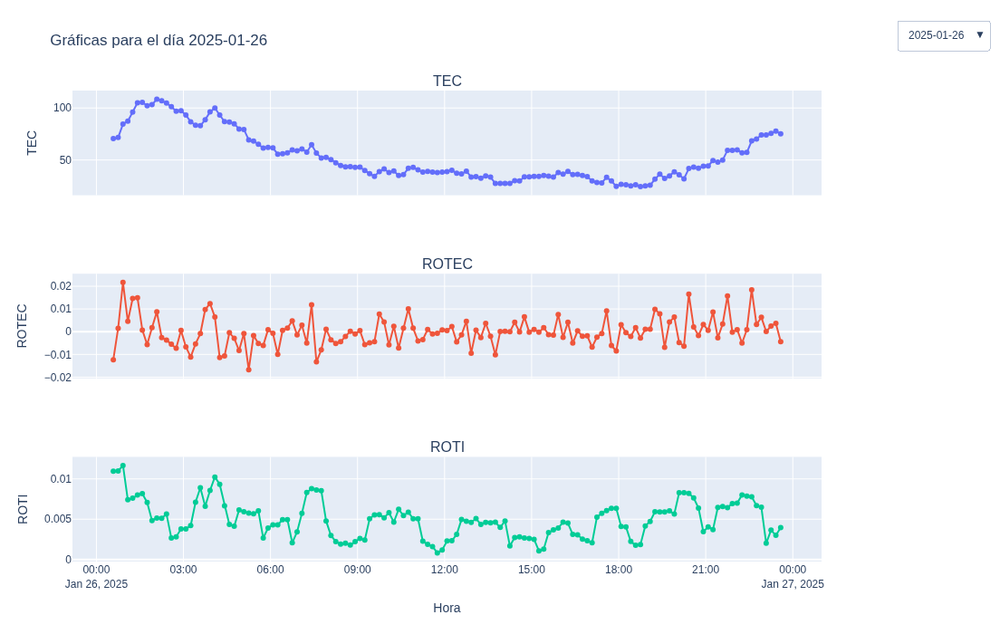

In [28]:
ploteo_TEC_ROTEC_ROTI(df_TEC_ROTI)

# **1.1.3 LA COLUMNA DE TIEMPO SE COLOCA COMO INDICE**

In [31]:
df_TEC_ROTI= df_TEC_ROTI.set_index('Tiempo')

df_TEC_ROTI= df_TEC_ROTI.drop(columns=["lat","lon","archivo"])

df_TEC_ROTI.head()

,TEC,ROTEC,ROTI
Tiempo,,,
2025-01-26 00:35:00,70.689140,-0.012351,0.010958
2025-01-26 00:45:00,71.584206,0.001492,0.010985
2025-01-26 00:55:00,84.608345,0.021707,0.011665
2025-01-26 01:05:00,87.345276,0.004562,0.007403
2025-01-26 01:15:00,96.122950,0.014629,0.007612


# **1.1.4 RECORTAREMOS EL PARAMETRO S4 AL RANGO DE FECHA df_TEC_ROTI**

In [36]:
fecha_inicio_tec= df_TEC_ROTI.index.min()
print("FECHA INICIO: ",fecha_inicio_tec)
fecha_fin_tec= df_TEC_ROTI.index.max()
print("FECHA FIN: ",fecha_fin_tec)

FECHA INICIO:  2025-01-26 00:35:00
FECHA FIN:  2025-12-30 18:15:00


# **2.1 PREPARAMOS AHORA EL S4**

# **2.1.1 LECTURA DEL S4**

In [45]:
import os
ESTACION = ["JICAMARCA","HUANCAYO","PIURA","CUZCO","PUCALLPA","AYACUCHO","TACNA","IQUITOS"]
ABREVIATURA = ["jic","hyo","piu","cuz","pucall","aya","tac","iqui"]
print("El número de Estaciones GNSS del IGP en el Peru es: ",len(ESTACION))
PATH     ="C:/Users/soporte/Documents/CENTELLEO_INOSFERICO_DAML_PERU"
N_ESTACION  = 0 # dependiendo del orden podemos seleccionar la ubicacion
PATH       ="/home/soporte/Documents/CENTELLEO_INOSFERICO_DAML_PERU/notebook"
filename   = f"df_max_s4_all_{ABREVIATURA[N_ESTACION]}.csv"
file_base_s4 = os.path.join(PATH,filename)
print("Nombre del archivo:",filename)
df_max_s4_all=pd.read_csv(file_base_s4)

El número de Estaciones GNSS del IGP en el Peru es:  8
Nombre del archivo: df_max_s4_all_jic.csv


In [47]:
df_max_s4_all.head()

,ID_Satelite,Tiempo,S4,Azimuth,Elevacion,is_Outlier,Cintilacion
0,9,2023-01-01 00:01:00,0.092,186.0,41.0,False,0
1,9,2023-01-01 00:02:00,0.092,186.0,41.0,False,0
2,9,2023-01-01 00:03:00,0.092,185.0,40.0,False,0
3,9,2023-01-01 00:04:00,0.138,185.0,40.0,False,0
4,6,2023-01-01 00:05:00,0.093,226.0,44.0,False,0


In [51]:
# Ponemos 'timestamp' como índice
df_max_s4_all["Tiempo"] = pd.to_datetime(df_max_s4_all["Tiempo"])
df_max_s4_all = df_max_s4_all.set_index('Tiempo')
df_max_s4_all.head()
fecha_inicio_s4= df_max_s4_all.index.min()
print("FECHA INICIO: ",fecha_inicio_s4)
fecha_fin_s4= df_max_s4_all.index.max()
print("FECHA FIN: ",fecha_fin_s4)

FECHA INICIO:  2023-01-01 00:01:00
FECHA FIN:  2025-07-17 23:45:00
